# Needed packages

In [1]:
import pickle
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm
from copy import deepcopy
import numpy as np
import pandas as pd
from scipy.stats import chi2

from radardetseval.visualization.plot_polyline import plot_polyline, plot_polyline_range_rates
from radardetseval.visualization.plot_sensor import plot_sensor
from radardetseval.visualization.plot_point import plot_point
from radardetseval.visualization.plot_detection import plot_detection_scs
from radardetseval.visualization.utilities import publish_reduced_labels
from radardetseval.utilities.ecdf import ecdf
from radardetseval.utilities.cart_state_to_polar_state import cart_state_to_polar_state



Bad key "text.kerning_factor" on line 4 in
c:\users\lz7c3c\wkspaces\aspe0000_00_common\sandbox\radardetectionsevaluation\.venv_pe\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


# Load data

In [2]:
angles = [5, 15, 30, 45, 60, 75, 85, 90, 95, 105, 120, 135, 150, 165, 175, 180]
gt_vx = 4.0
n_samples = 200000
data = dict()
for alpha in angles:
    data_path = r'private\sim_arc_' + str(alpha) + '_degree_vel_' + str(gt_vx) + '_n' + str(n_samples) + '.pickle'
    data_key = 'angle_' + str(alpha)
    with open(data_path, 'rb') as handle:
        data[data_key] = pickle.load(handle)
        
color_map = cm.get_cmap('rainbow', len(data))
colors = color_map(range(len(data)))

# Ground truth data summary

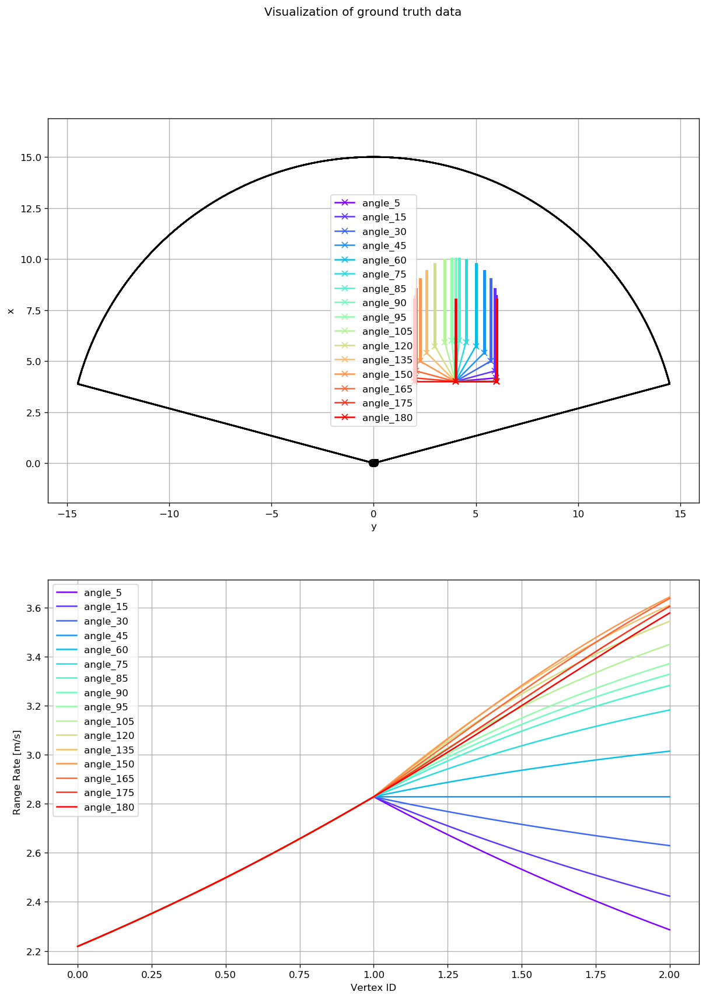

In [3]:
def plot_summary(ax, gt_polyline, key, color):
    plot_sensor(ax, azimuth=np.deg2rad(75.0), max_range=15.0)
    plot_polyline(ax, gt_polyline, color=color, label = key)
   
    
def plot_rr(ax, gt_polyline, key, color):
    vertex_ids = gt_polyline.signals['vertex_id'].values
    vertex_ids_discirte = np.linspace(vertex_ids.min(), vertex_ids.max(), 1000)
    discirte_df = gt_polyline.interpolate_polygon(vertex_ids_discirte, vertex_ids, gt_polyline.signals)
    ref_range, ref_azimuth, ref_range_rate, _ = cart_state_to_polar_state(discirte_df['x'],
                                                                          discirte_df['y'],
                                                                          discirte_df['vx'],
                                                                          discirte_df['vy'])
    ax.plot(vertex_ids_discirte, ref_range_rate, color=color, label=key) 
    
    
fig1=plt.figure(figsize=(12, 16), dpi= 120, facecolor='w', edgecolor='k')
fig1.suptitle('Visualization of ground truth data')

ax1 = plt.subplot(2, 1, 1)
i = 0
for key, value in data.items(): 
    plot_summary(ax1, deepcopy(value['gt_polyline']), key, colors[i])  
    i +=1
ax1.set_xlabel('y')
ax1.set_ylabel('x')
publish_reduced_labels(ax1)
ax1.axis('equal')
ax1.grid()

ax2 = plt.subplot(2, 1, 2)
i = 0
for key, value in data.items(): 
    plot_rr(ax2, deepcopy(value['gt_polyline']), key, colors[i])
    i +=1
ax2.set_xlabel('Vertex ID')
ax2.set_ylabel('Range Rate [m/s]')  
publish_reduced_labels(ax2)
ax2.grid()

## Data examples

In [4]:
sim_out = deepcopy(data['angle_5']['sim_out'])
valid_df = sim_out.iloc[0:5]
valid_df

,unique_id,vertex_id,x,y,vx,vy,range,azimuth,range_rate,nees_value,gt_vertex_id
0,0.0,1.844084,4.130263,5.658455,3.981735,-0.006212,7.005511,0.940266,2.342507,0.113214,1.789392
1,0.0,1.119755,3.904801,4.193792,3.991403,0.012356,5.730215,0.821067,2.728947,0.139887,0.836660
2,0.0,1.833544,4.000505,5.744545,4.016467,-0.001098,7.000274,0.962490,2.294423,8.823276,1.829314
3,0.0,1.233305,3.778141,4.554398,3.978700,0.002526,5.917507,0.878290,2.542218,0.430950,1.387486
4,0.0,0.504360,4.187633,5.073976,3.995760,0.018473,6.578868,0.880808,2.557660,8.317469,1.516281


# Analyze in reference of vertex id 

Check an impact of location of detection within segment. Data will be split based on vertex id and there are two ptions how to do that:

* Based on Grount Truth vertex ID
* Beased on Vertex ID given by optimization procedure

Since Ground Truth vertex ID was uniformly drawned we can expect that number of samples for specific bin will will be similar. We can also expect change in mean of nees value from middle of segment to the edge of the segment from 2.0 to 2.5. 
However, in real wordl data the groud truth vertex ID is unknwon. The only known information is vertex id found in optimization process. So NEES mean value dependency needs to be analyzed having this data to decide which threshold should be used.

In [5]:
def aggregate_nees_data(grouped_df):  
    df = pd.DataFrame([grouped_df['nees_value'].mean(), grouped_df['nees_value'].count()]).T
    df.columns = ['mean NEES', 'count']
    df['vertex_id'] = bins[0:-1] + 1/nbins/2   
    return df   


In [6]:
nbins = 201
bins = np.linspace(0,2,nbins)

for key, value in data.items(): 
    sim_out = deepcopy(value['sim_out'])
    value['sim_out_bins_est'] = sim_out.groupby(pd.cut(sim_out.vertex_id, bins))
    value['sim_out_bins_gt'] = sim_out.groupby(pd.cut(sim_out.gt_vertex_id, bins))
    value['nees_data_est'] = aggregate_nees_data(value['sim_out_bins_est'])
    value['nees_data_gt'] = aggregate_nees_data(value['sim_out_bins_gt'])

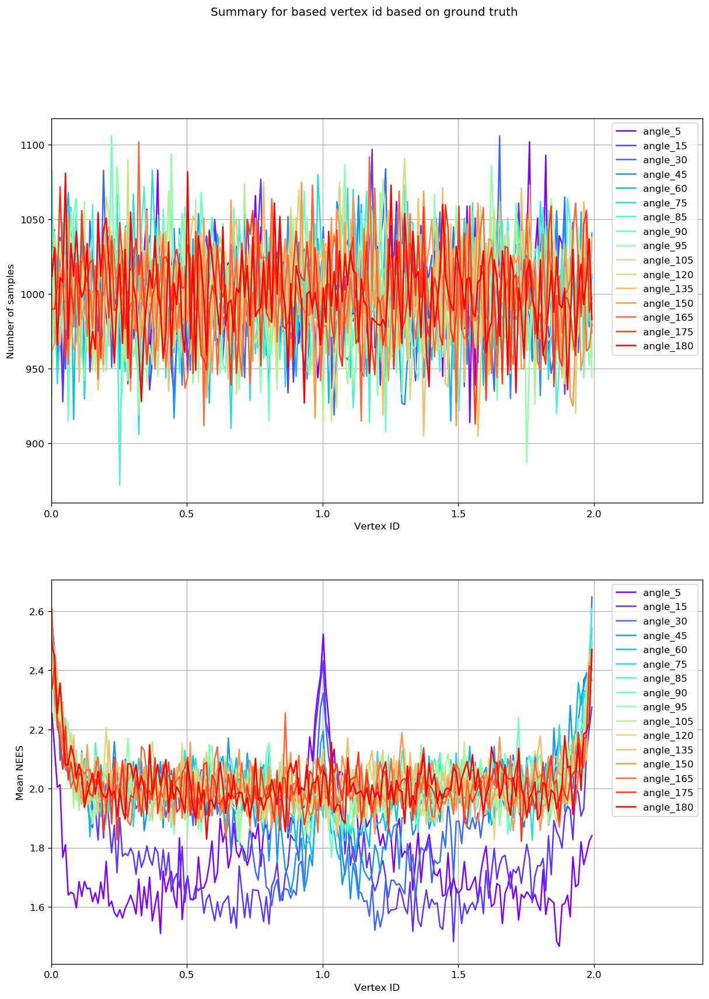

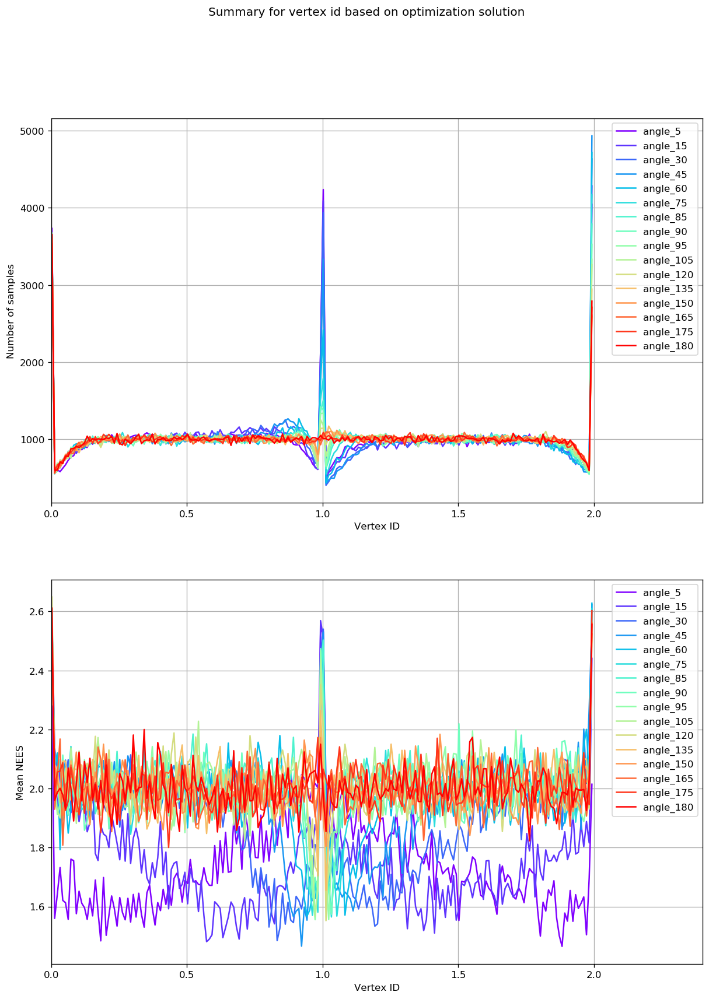

In [7]:
def visualize_in_vertex_id_reference(data, dict_name):
    ax1 = plt.subplot(2, 1, 1)
    i = 0
    for key, value in data.items():
        valid_data = value[dict_name]
        ax1.plot(valid_data['vertex_id'], valid_data['count'], color=colors[i], label = key)
        i +=1
    publish_reduced_labels(ax1)
    ax1.set_xlabel('Vertex ID')
    ax1.set_ylabel('Number of samples')
    ax1.grid()
    ax1.set_xlim([0, 2.4])
    

    ax2 = plt.subplot(2, 1, 2)
    i = 0
    for key, value in data.items():
        valid_data = value[dict_name]
        ax2.plot(valid_data['vertex_id'], valid_data['mean NEES'], color=colors[i], label = key)
        i +=1
    publish_reduced_labels(ax2)
    ax2.set_xlabel('Vertex ID')
    ax2.set_ylabel('Mean NEES')
    ax2.grid()
    ax2.set_xlim([0, 2.4])

fig3=plt.figure(figsize=(12, 16), dpi= 120, facecolor='w', edgecolor='k')
fig3.suptitle('Summary for based vertex id based on ground truth ')
visualize_in_vertex_id_reference(data, 'nees_data_gt')

fig4=plt.figure(figsize=(12, 16), dpi= 120, facecolor='w', edgecolor='k')
fig4.suptitle('Summary for vertex id based on optimization solution')
visualize_in_vertex_id_reference(data, 'nees_data_est')

## 2D histogram as heatmap of vertex id (ground truth vs optimization) for particular example

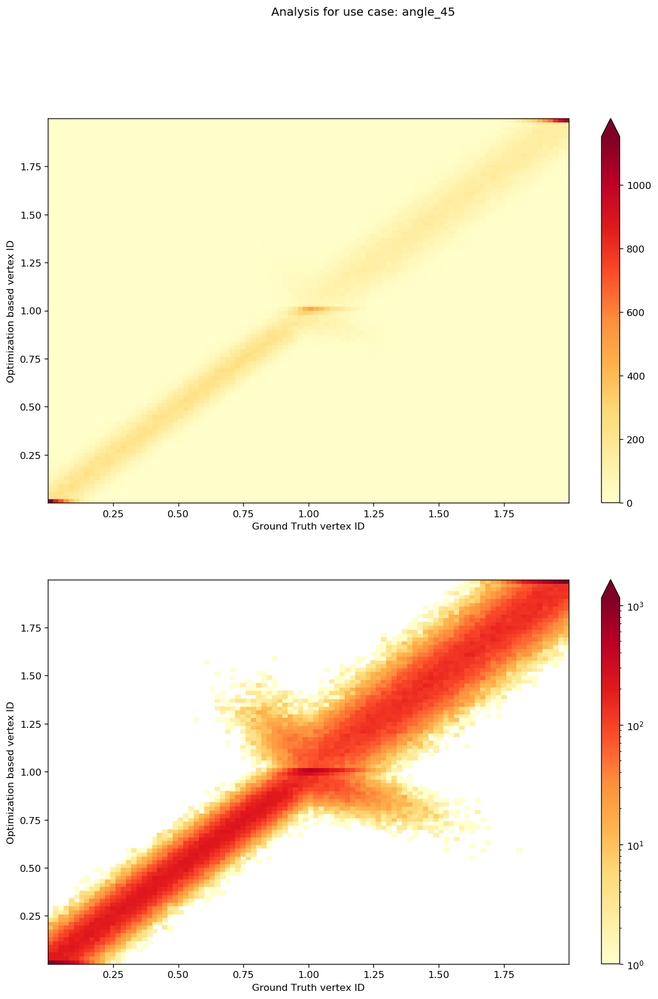

In [8]:
data_to_consider = 'angle_45'
fig, ax = plt.subplots(2, 1, figsize=(12, 16), dpi= 120, facecolor='w', edgecolor='k')
fig.suptitle('Analysis for use case: ' + data_to_consider)
sim_out = data[data_to_consider]['sim_out']

hist_out  = ax[0].hist2d(sim_out.gt_vertex_id, sim_out.vertex_id, bins=100,
                   cmap='YlOrRd')
ax[0].set_xlabel('Ground Truth vertex ID')
ax[0].set_ylabel('Optimization based vertex ID')
fig.colorbar(hist_out[3], ax=ax[0], extend='max')

hist_out = ax[1].hist2d(sim_out.gt_vertex_id, sim_out.vertex_id, bins=100,
                   norm=mcolors.LogNorm(),
                   cmap='YlOrRd')
ax[1].set_xlabel('Ground Truth vertex ID')
ax[1].set_ylabel('Optimization based vertex ID')
fig.colorbar(hist_out[3], ax=ax[1], extend='max')

# Analysis for several ranges of vertex id - sub sets analysis

In [9]:
relevant_vertex_bins = [[0.0, 0.01],
                        [0.01, 0.06],
                        [0.2, 0.25],
                        [0.475, 0.525],
                        [0.94, 0.99],
                        [0.99, 1.01],
                        [1.01, 1.06],
                        [1.2, 1.25]]

## Analyze in reference of polyline angle

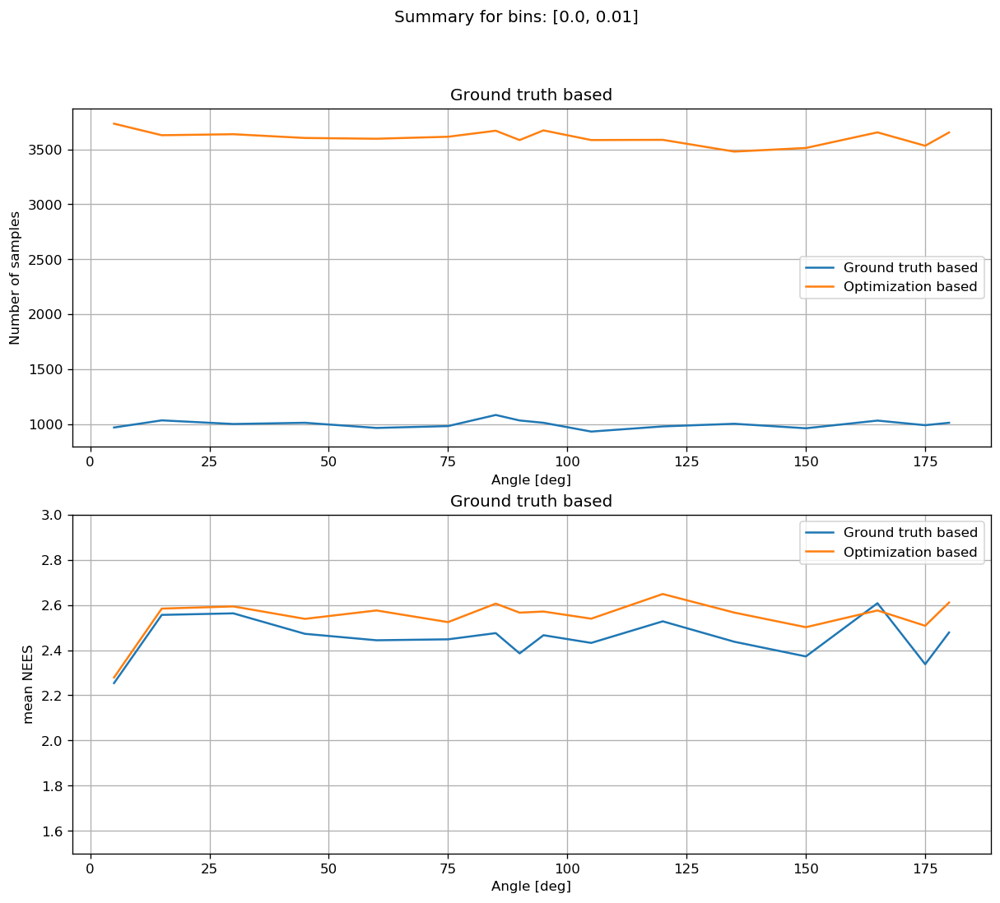

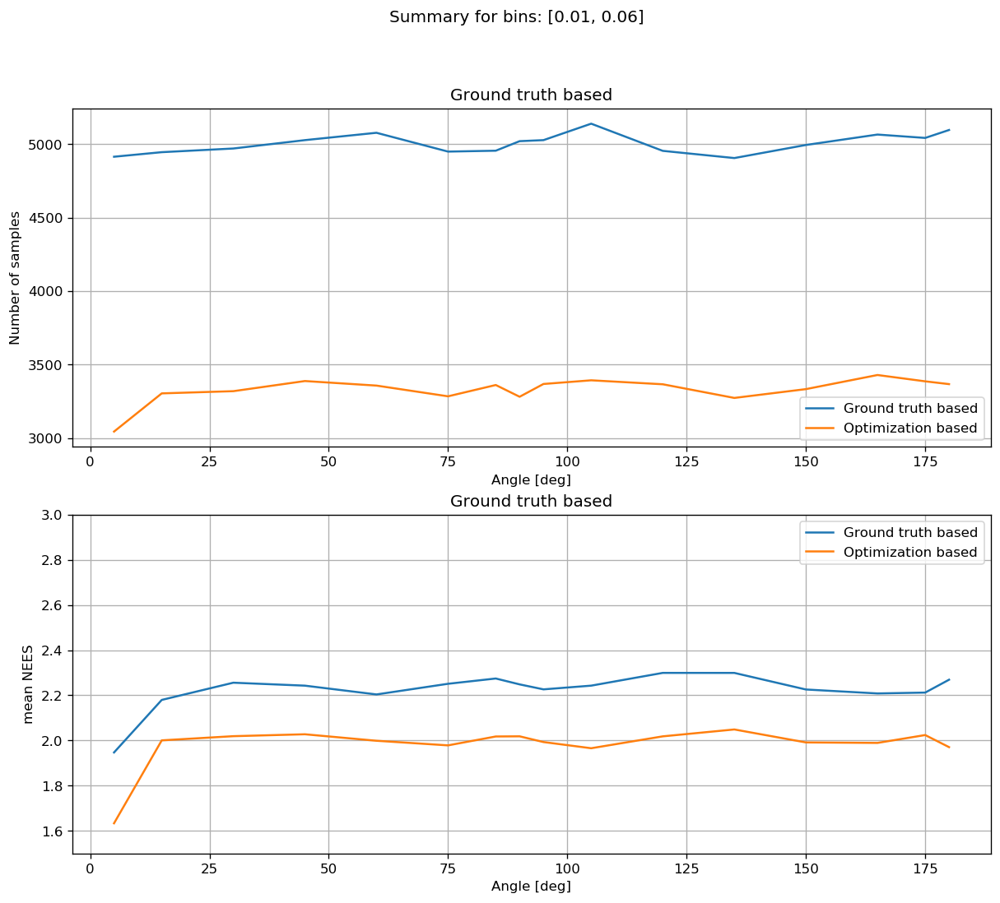

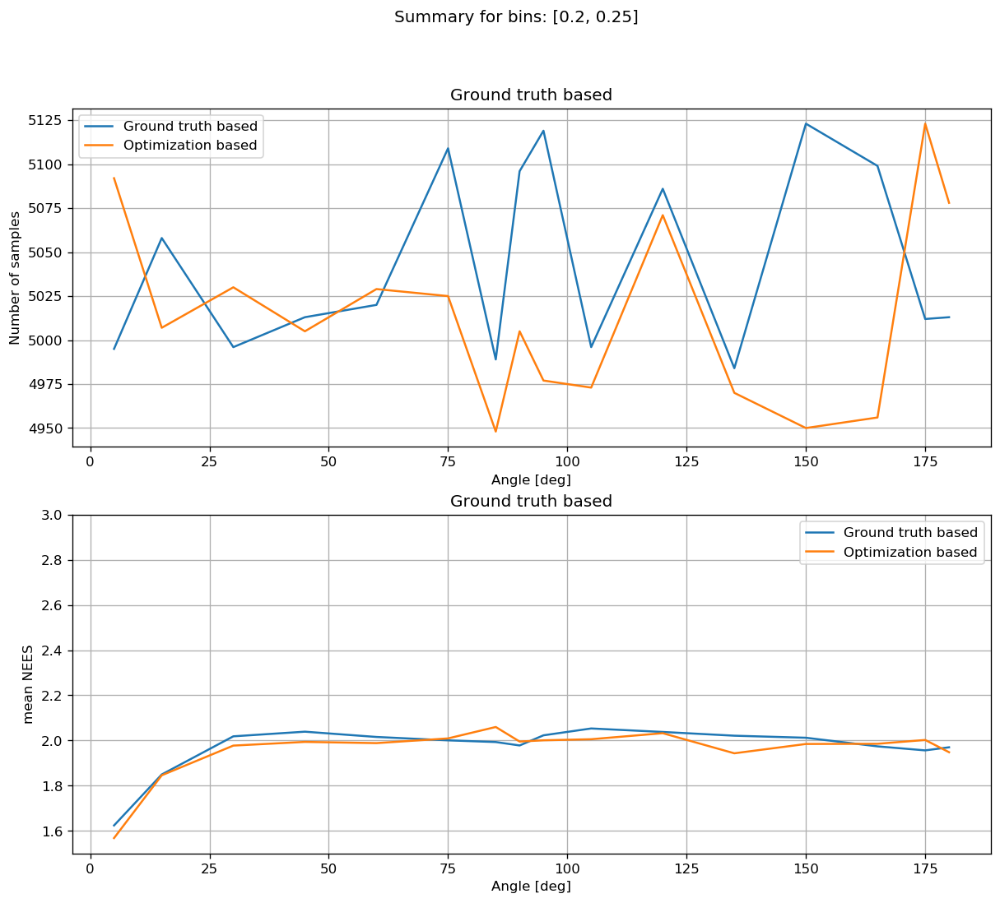

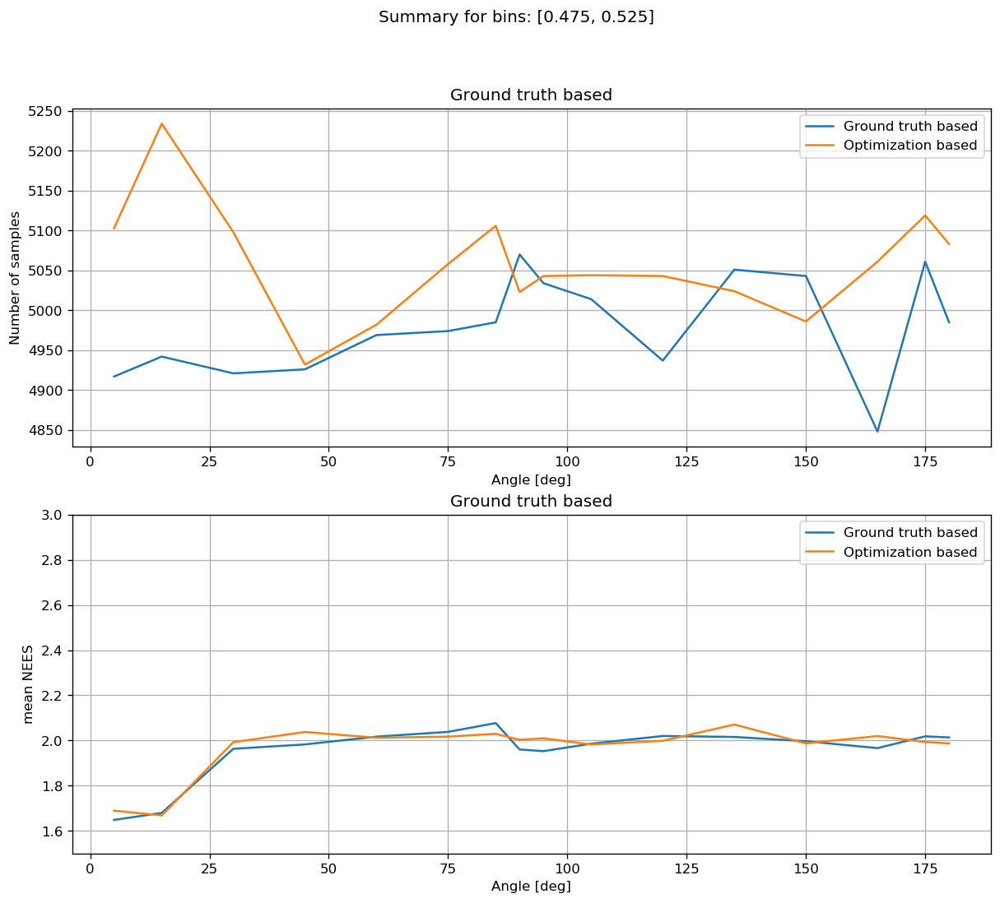

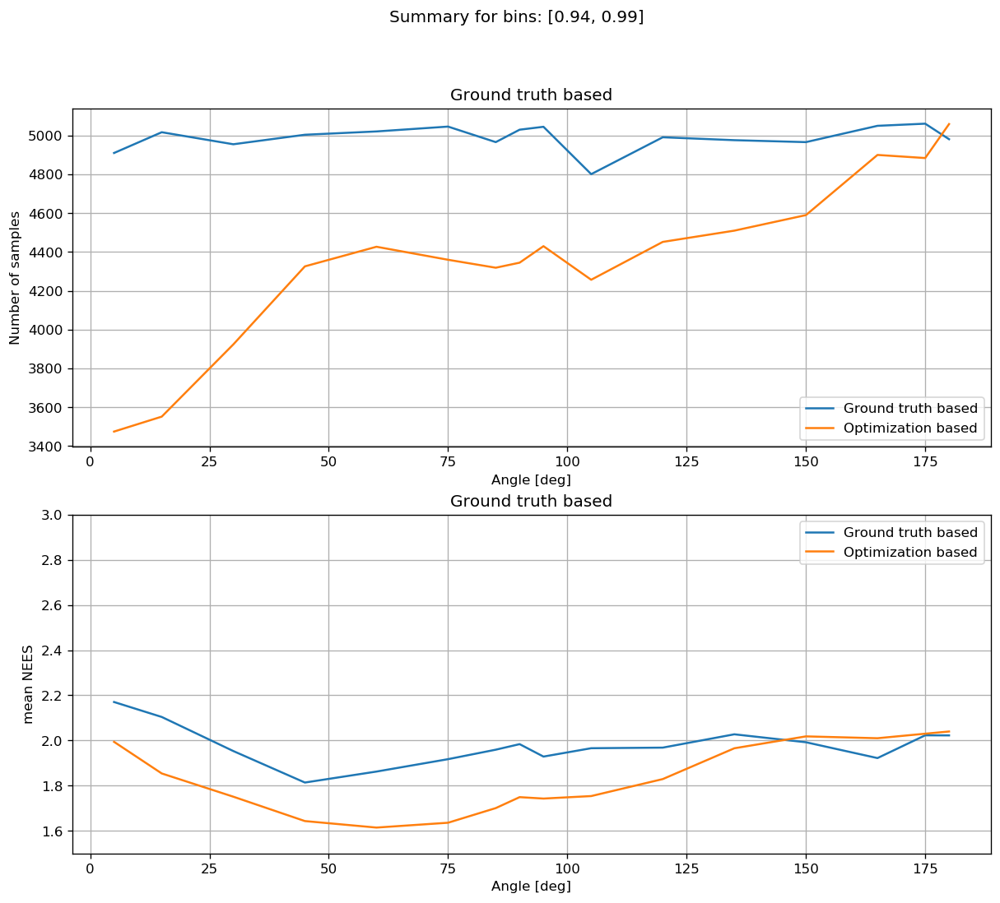

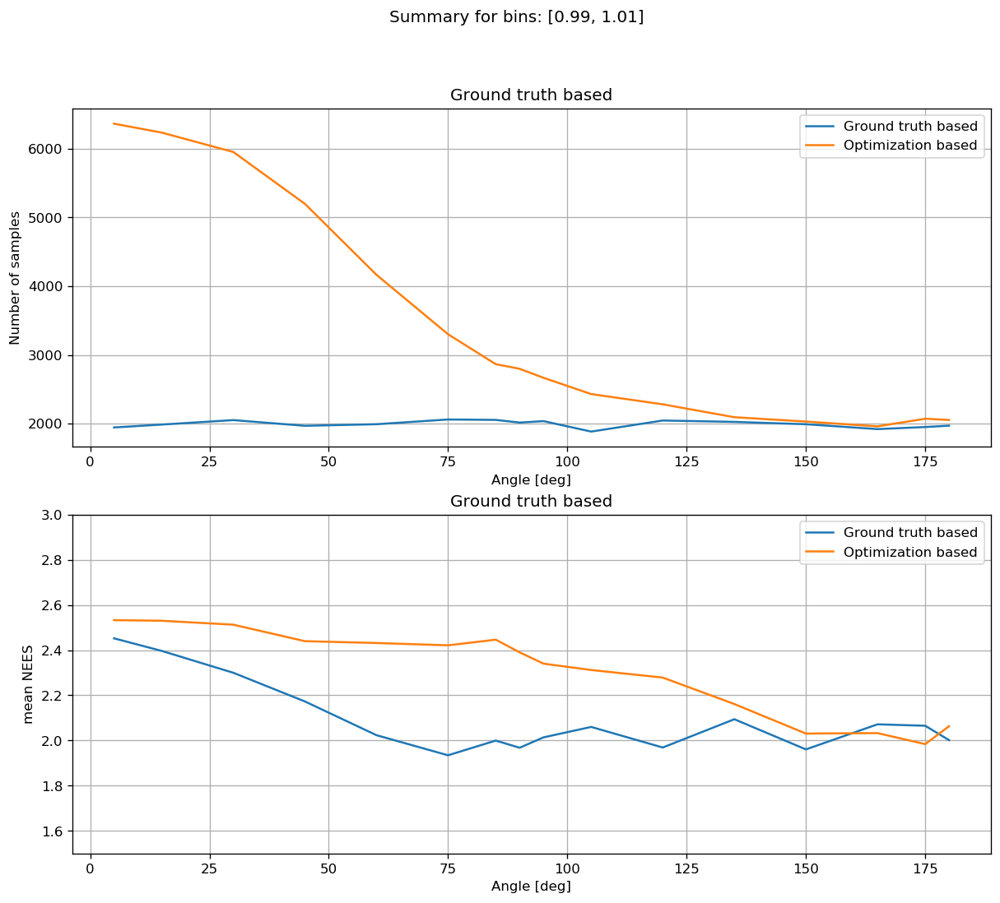

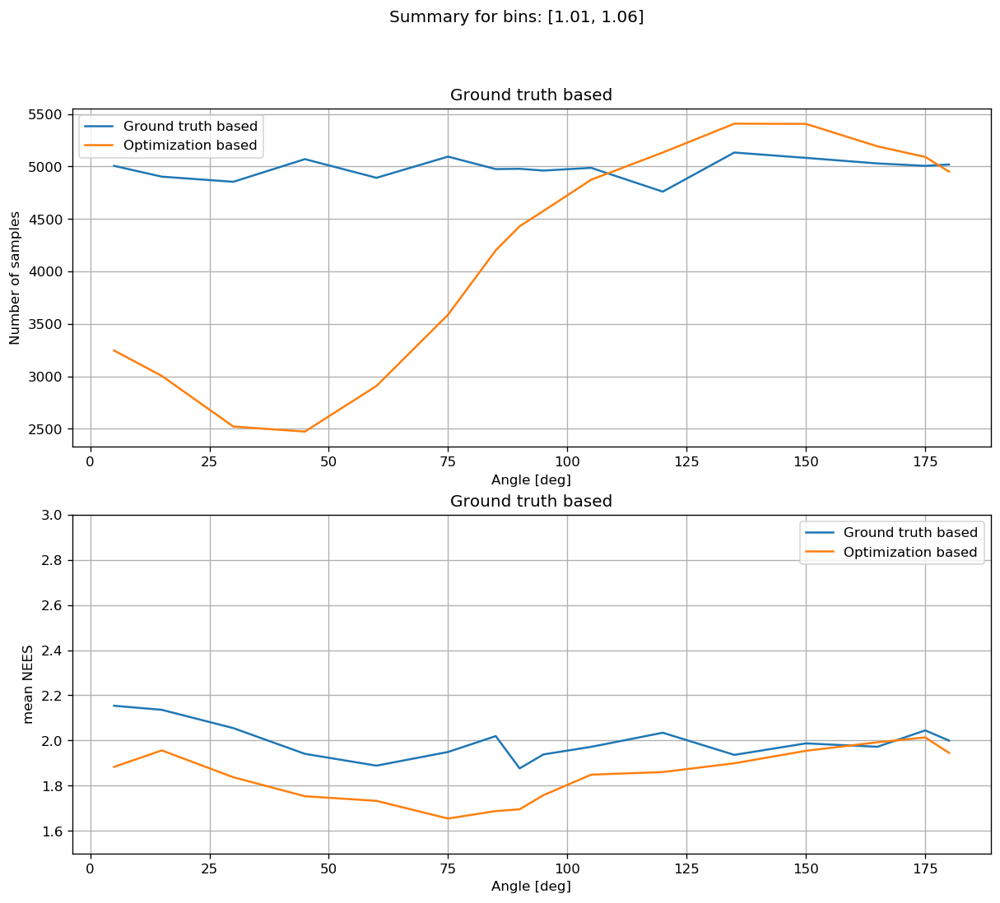

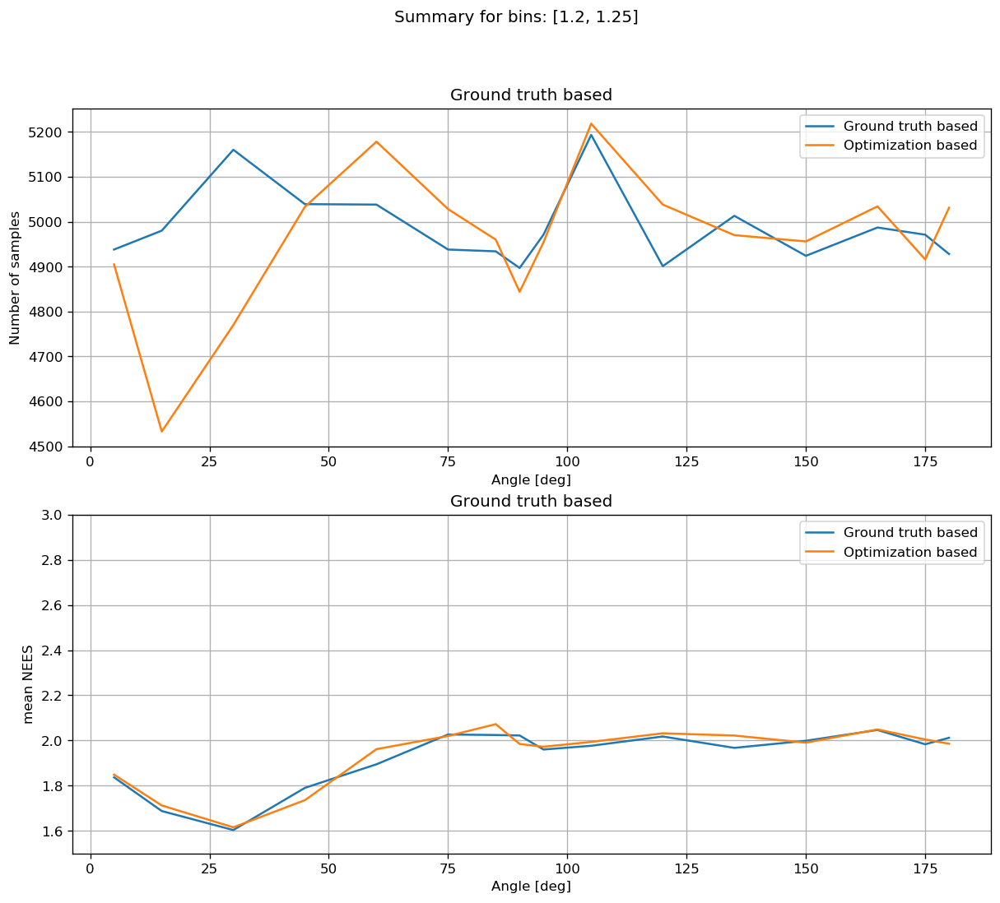

In [10]:
def get_summary_for_given_bin_over_angle(data, column_name):
    output = dict()
    for single_bin in relevant_vertex_bins:
        bin_key = str(single_bin)
        single_out = dict()
        for key, value in data.items():
            _, key_num = key.split('_')
            key_num = int(key_num)
            df = value['sim_out']
            rel_df = df[(df[column_name] >= single_bin[0]) & (df[column_name] <= single_bin[1])]
            single_out[key_num] = pd.Series({
                'count': rel_df['nees_value'].count(),
                'mean NEES': rel_df['nees_value'].mean()
            })
        output[bin_key] = pd.DataFrame(single_out.values(), index=single_out.keys())
    return output




output_gt = get_summary_for_given_bin_over_angle(data, 'gt_vertex_id')
output_est = get_summary_for_given_bin_over_angle(data, 'vertex_id')

for single_bin in relevant_vertex_bins:
    bin_key = str(single_bin)
    data_gt = output_gt[bin_key]
    data_est = output_est[bin_key]
    fig=plt.figure(figsize=(12, 10), dpi= 120, facecolor='w', edgecolor='k')
    fig.suptitle('Summary for bins: ' + bin_key)
    
    ax1 = plt.subplot(2, 1, 1)
    ax1.plot(data_gt['count'] , label = 'Ground truth based')
    ax1.plot(data_est['count'], label = 'Optimization based')
    publish_reduced_labels(ax1)
    ax1.set_title('Ground truth based')
    ax1.set_xlabel('Angle [deg]')
    ax1.set_ylabel('Number of samples')
    ax1.grid()

    ax2 = plt.subplot(2, 1, 2)
    ax2.plot(data_gt['mean NEES'] , label = 'Ground truth based')
    ax2.plot(data_est['mean NEES'], label = 'Optimization based')
    publish_reduced_labels(ax2)
    ax2.set_title('Ground truth based')
    ax2.set_xlabel('Angle [deg]')
    ax2.set_ylabel('mean NEES')
    ax2.set_ylim([1.5, 3.0])
    ax2.grid()

## Analyze distributions

In [11]:
def plot_disttribution_summary(data, column_name, single_bin):
    chi2_dof = [2.0, 2.5]  # 3 variables so 3 degree of freedom
    xmax = 20
    x_ref = np.linspace(0, xmax, 1000)
    
    ax1 = plt.subplot(3, 1, 1)
    ax2 = plt.subplot(3, 1, 2)
    ax3 = plt.subplot(3, 1, 3)

    i = 0
    for key, value in data.items():
        df = value['sim_out']
        rel_df = df[(df[column_name] >= single_bin[0]) & (df[column_name] <= single_bin[1])]
        x_ecdf, y_ecdf = ecdf(rel_df['nees_value'])
        y_ref_ecdf_0 = chi2.cdf(x_ecdf, chi2_dof[0])
        y_ref_ecdf_1 = chi2.cdf(x_ecdf, chi2_dof[1])
        ecdf_diff_0 = y_ecdf - y_ref_ecdf_0
        ecdf_diff_1 = y_ecdf - y_ref_ecdf_1
        ax1.plot(x_ecdf, y_ecdf, color=colors[i], label=key)
        ax2.plot(x_ecdf, ecdf_diff_0, color=colors[i], label=key)
        ax3.plot(x_ecdf, ecdf_diff_1, color=colors[i], label=key)
        i += 1
    for dof in chi2_dof:
        y_ref_cdf = chi2.cdf(x_ref, dof)
        ax1.plot(x_ref, y_ref_cdf, label=f'Chi-square with k = {dof:.1f}')
    
    ax1.set_ylabel('Quantile [-]')  
    ax1.grid()
    ax1.legend()
    ax1.set_xlim([0, xmax]) 
    ax1.set_title('NEES cumulative distribution of simulated detection')

    ax2.set_ylabel('CDF difference [-]')
    ax2.grid()
    ax2.legend()
    ax2.set_xlim([0, xmax])
    ax2.set_title(f'Difference between empirical and reference Chi-square cumulative distribution with k= {chi2_dof[0]:.1f}')
    
    ax3.set_xlabel('NEES value [-]')
    ax3.set_ylabel('CDF difference [-]')
    ax3.grid()
    ax3.legend()
    ax3.set_xlim([0, xmax])
    ax3.set_title(f'Difference between empirical and reference Chi-square cumulative distribution with k= {chi2_dof[1]:.1f}')
    


### For optimization based verted ix

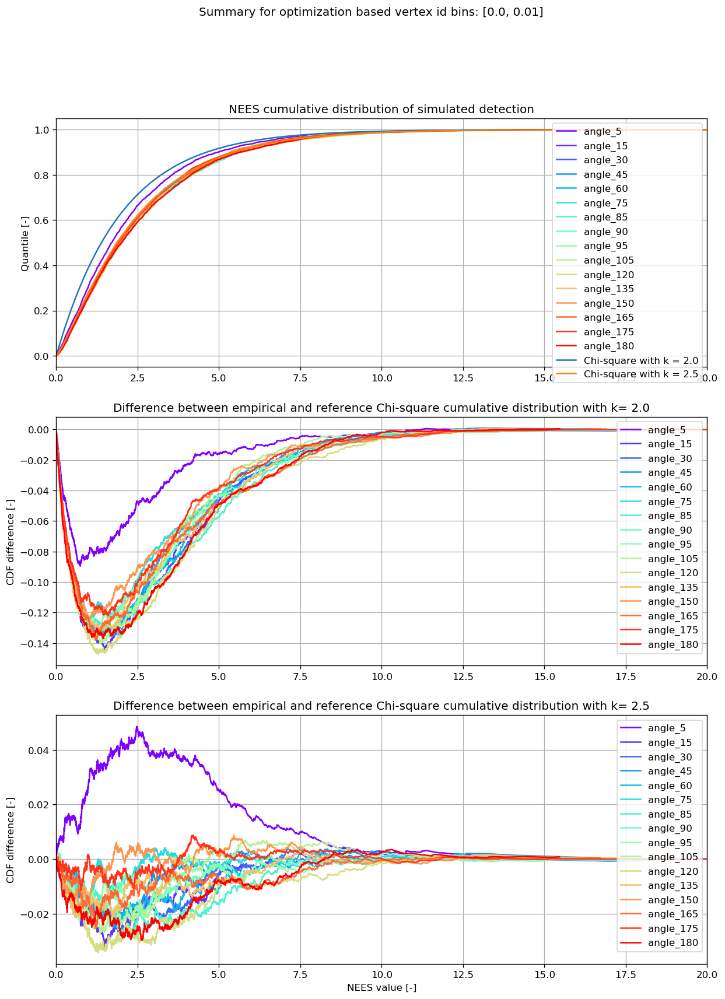

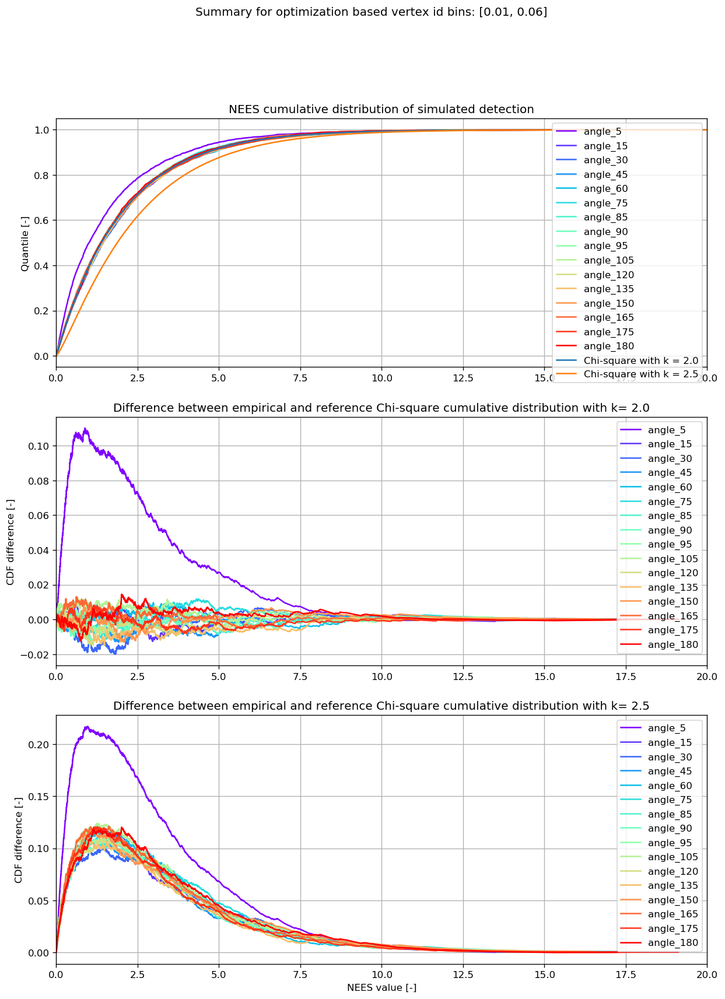

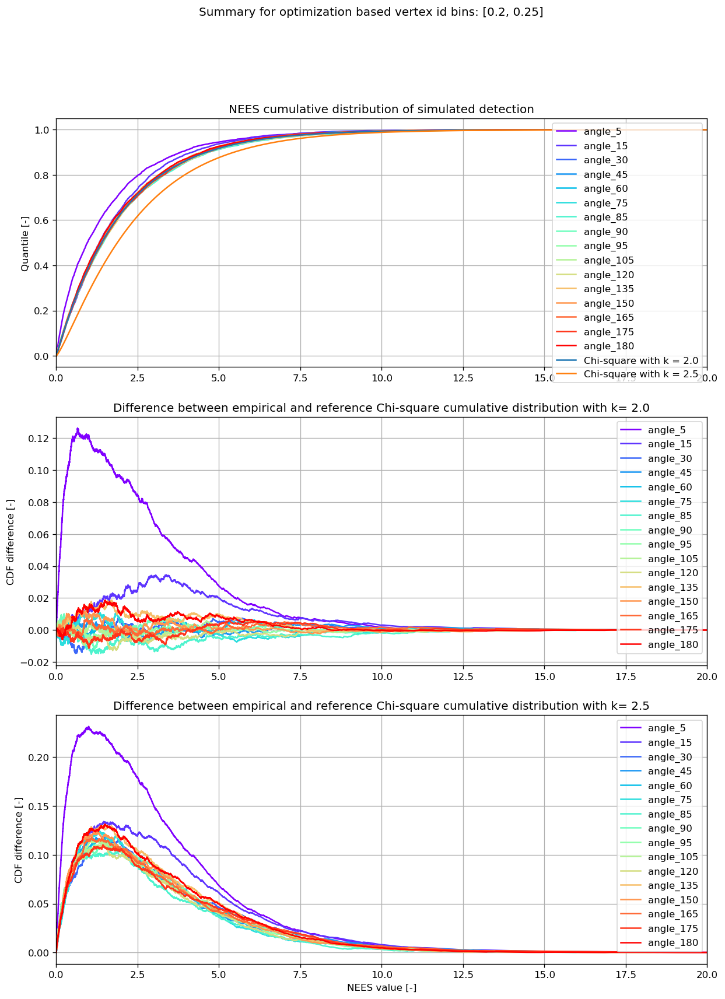

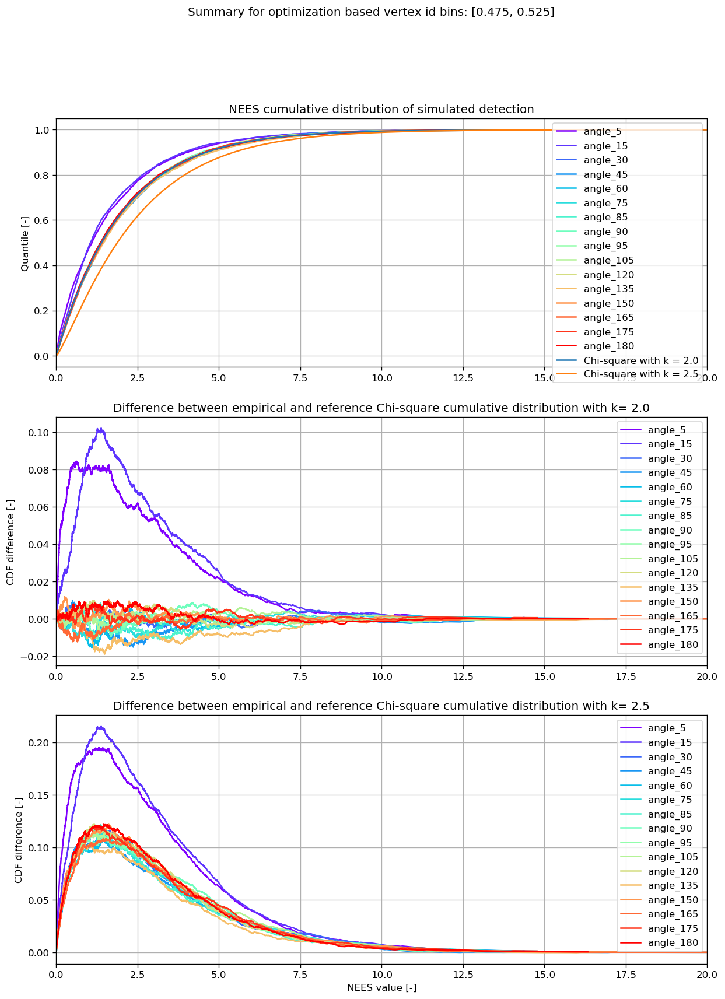

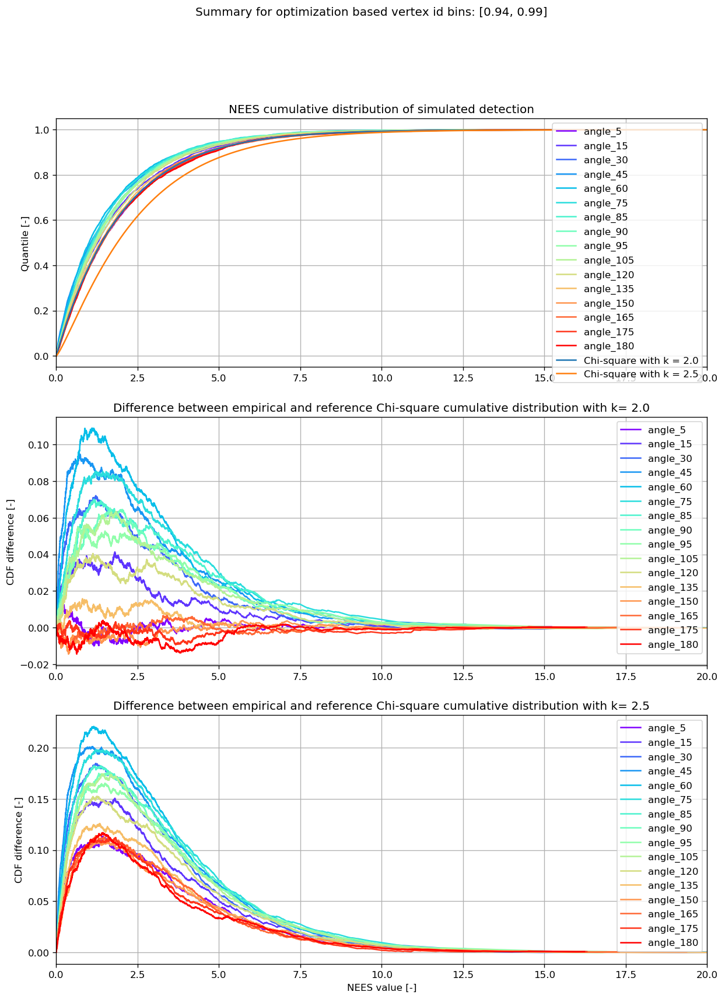

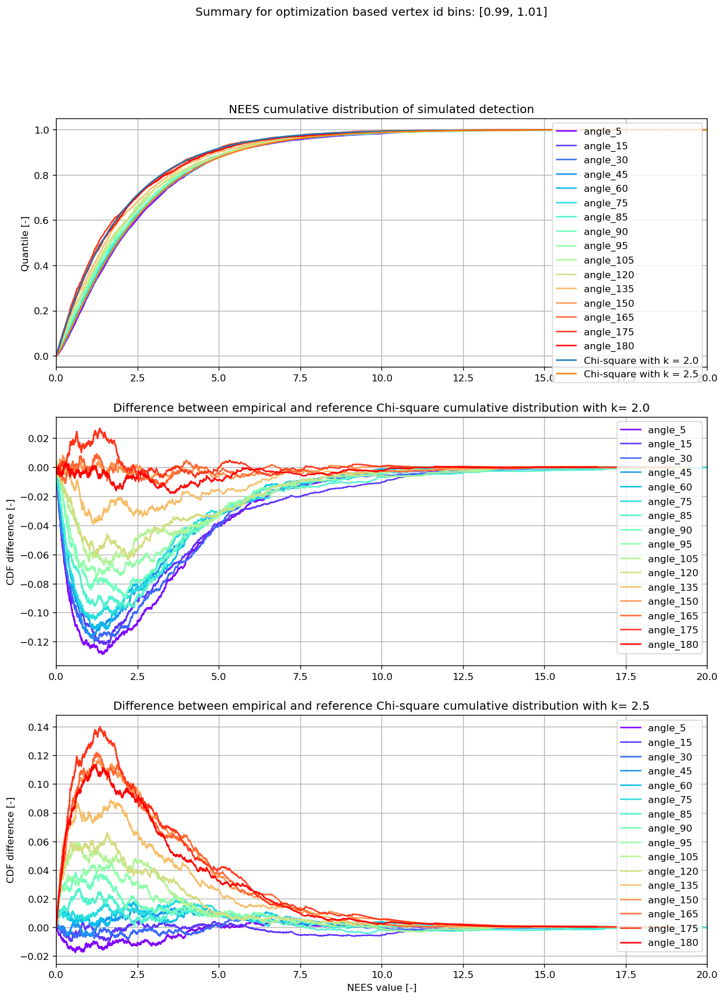

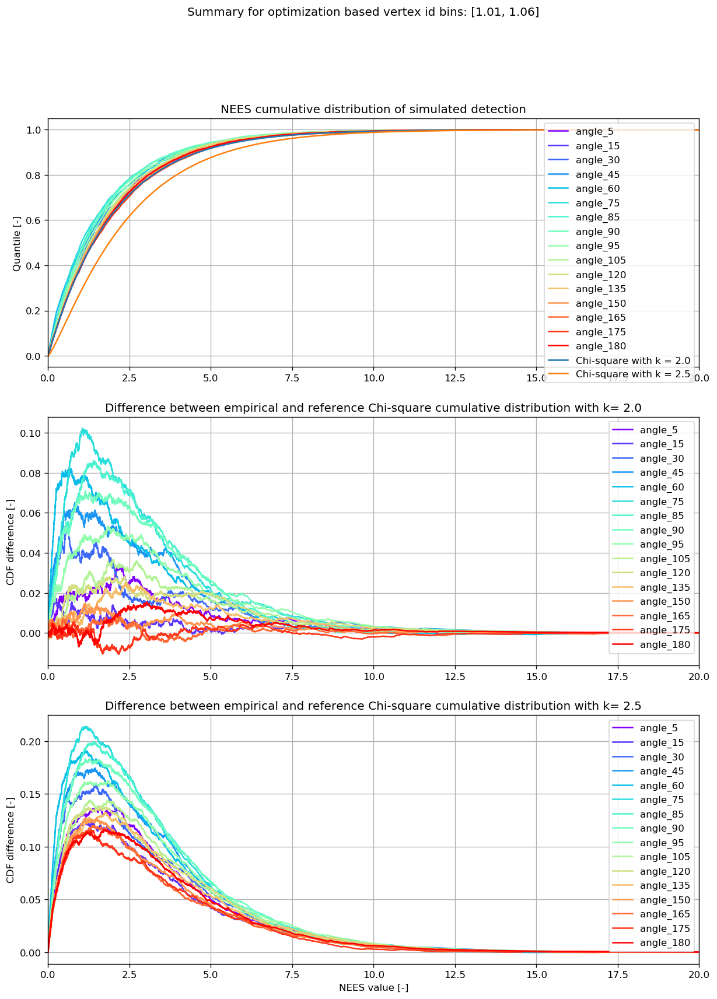

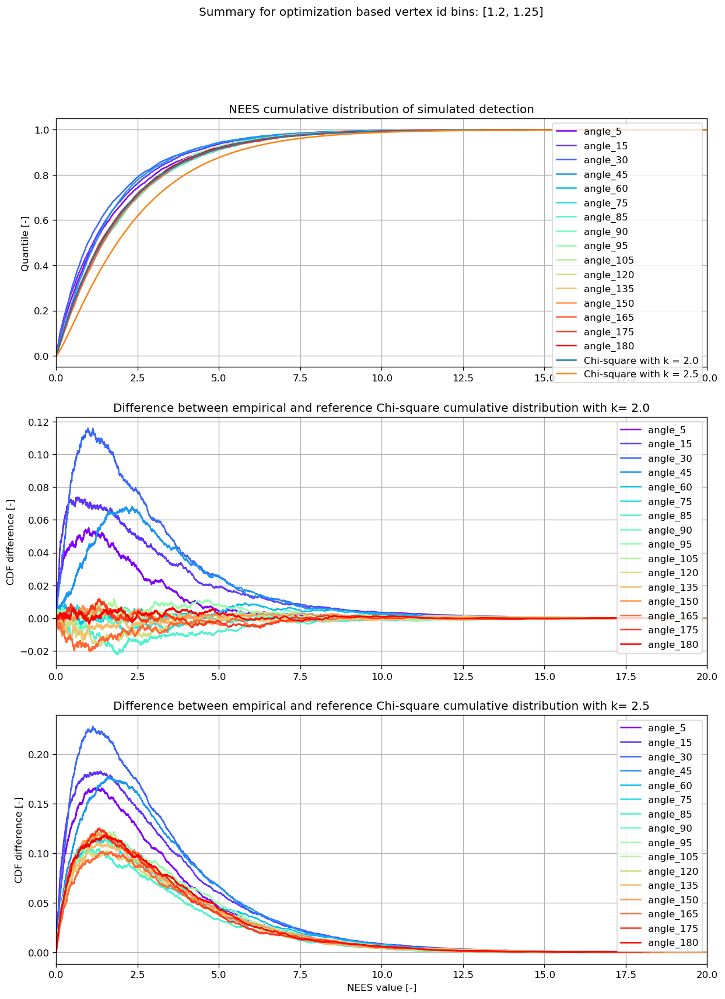

In [12]:
for single_bin in relevant_vertex_bins:
    bin_key = str(single_bin)
    fig=plt.figure(figsize=(12, 16), dpi= 120, facecolor='w', edgecolor='k')
    fig.suptitle('Summary for optimization based vertex id bins: ' + bin_key)
    plot_disttribution_summary(data, 'vertex_id', single_bin)
    

### For ground truth based verted ix

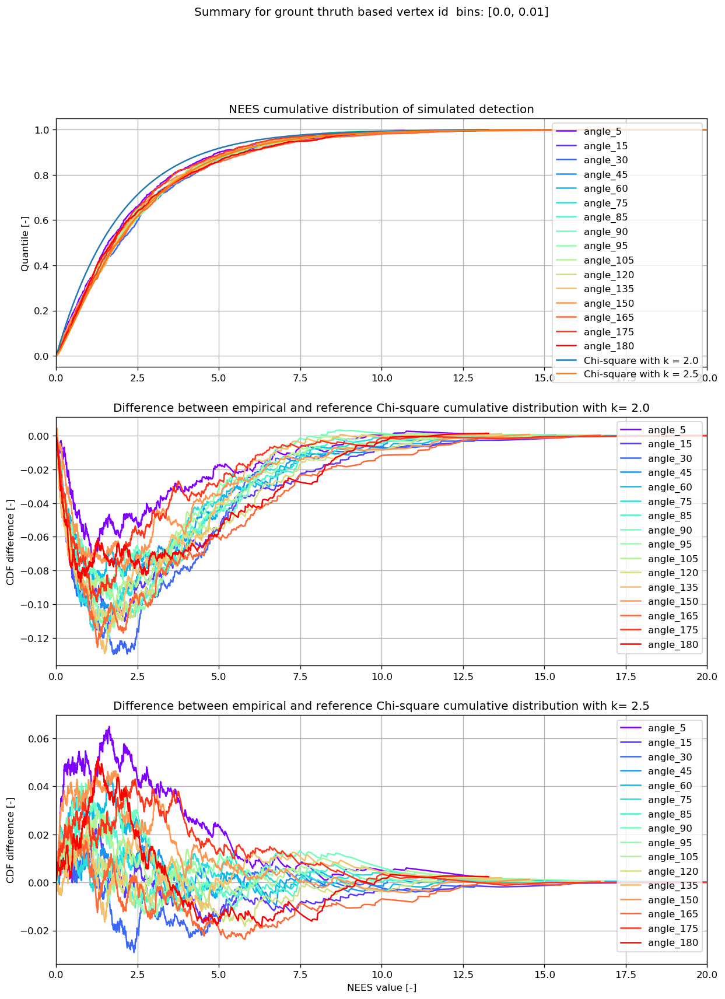

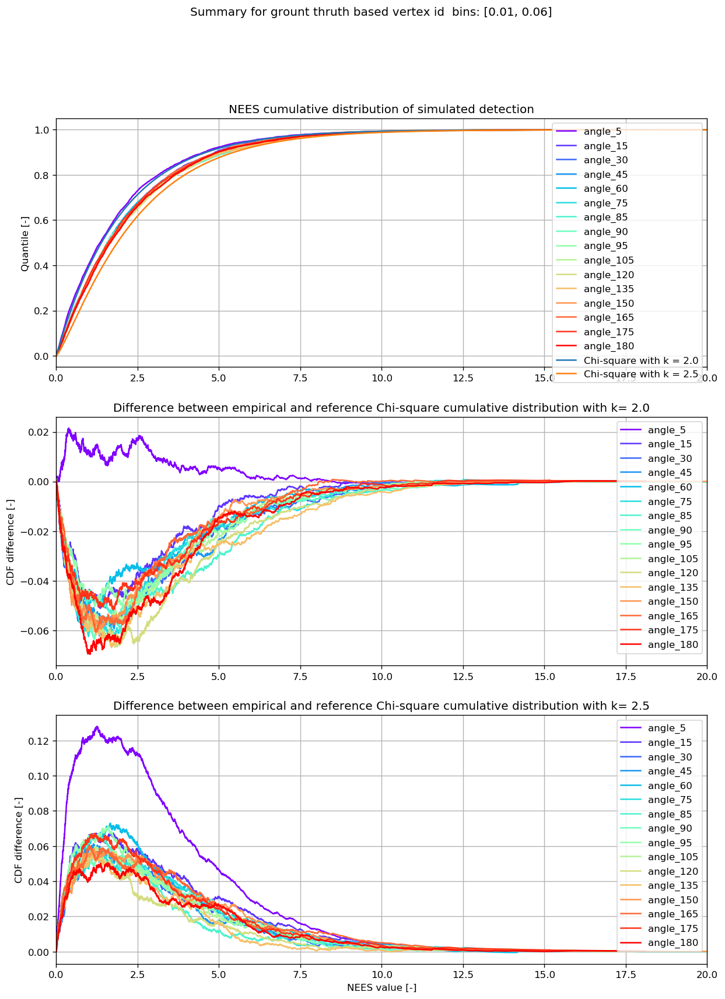

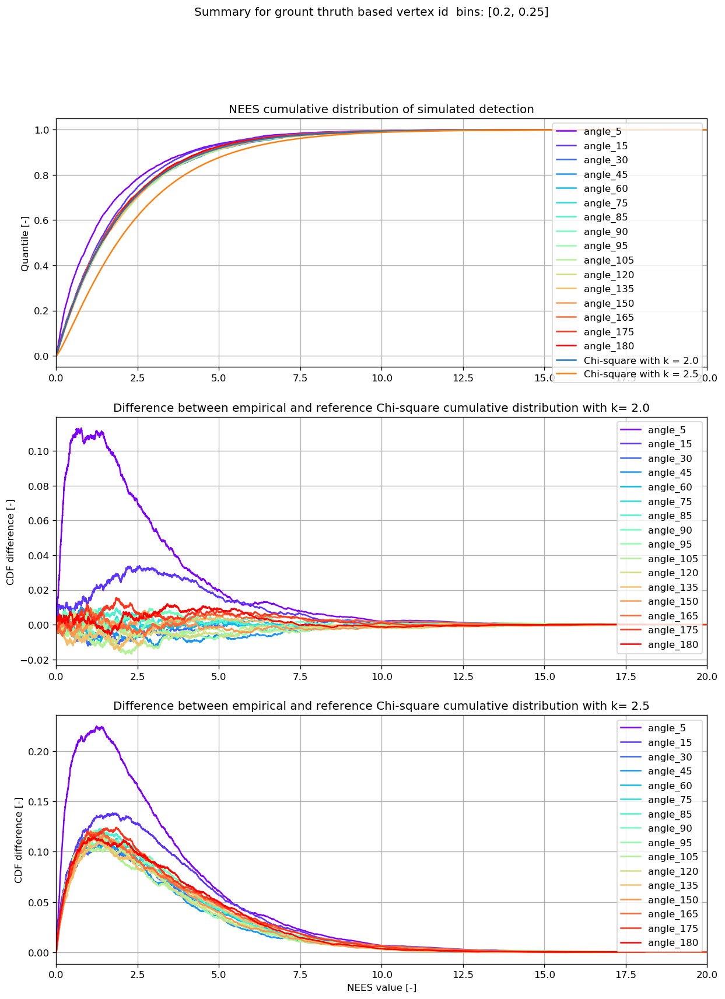

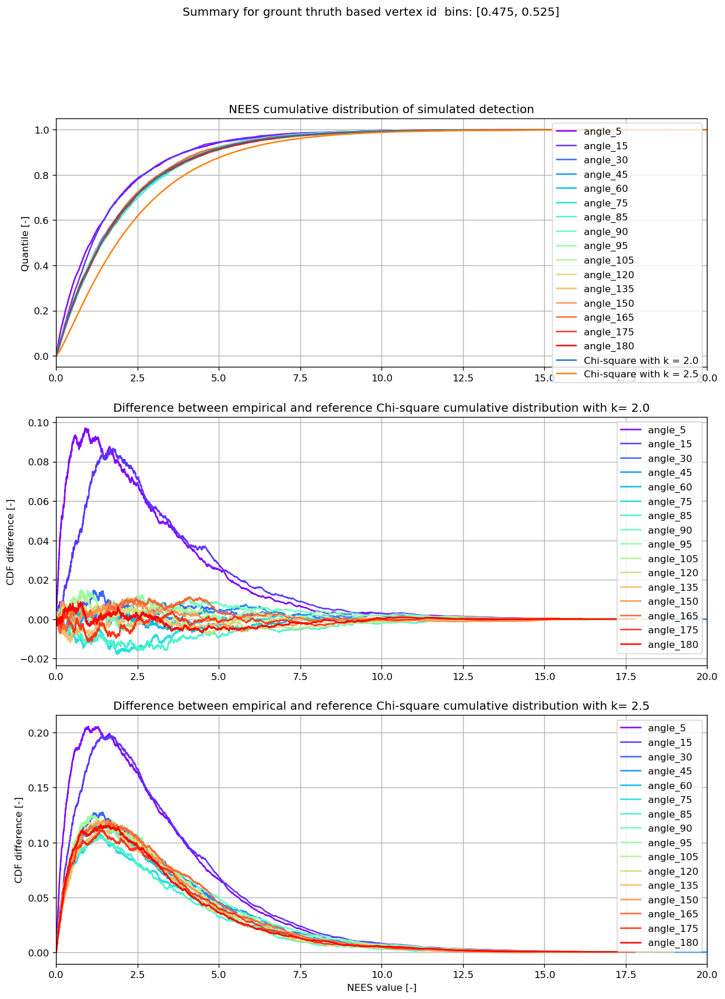

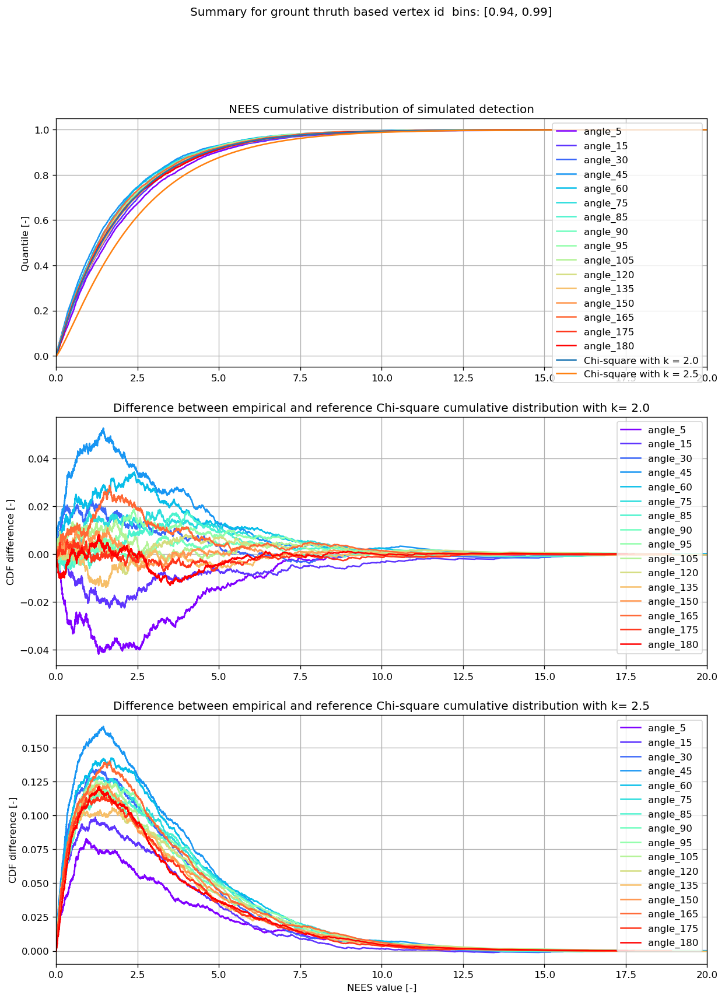

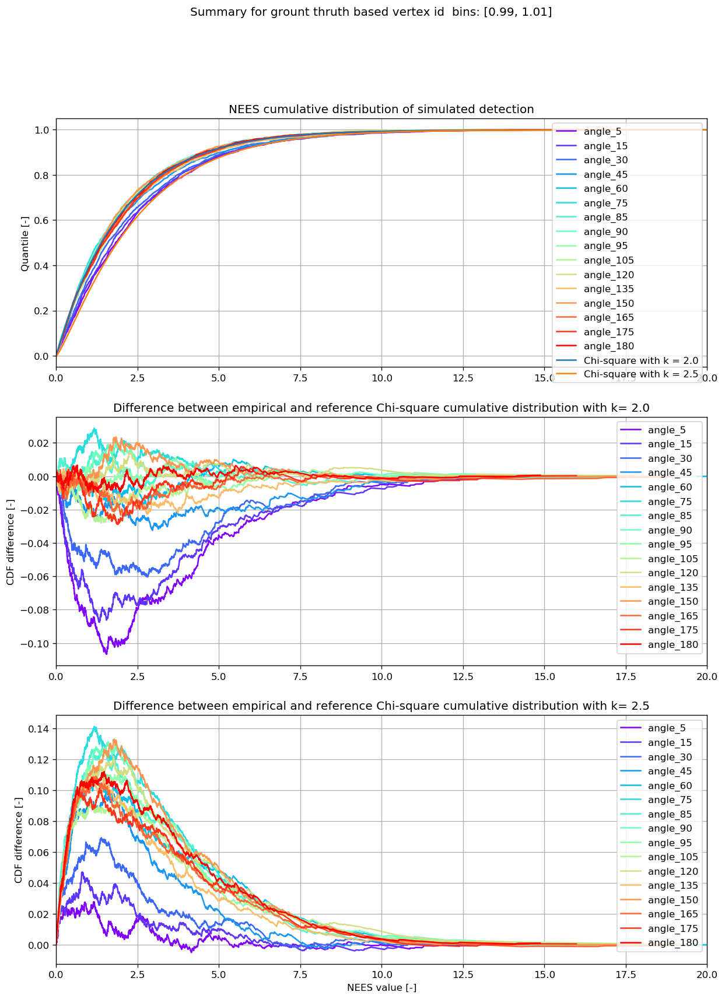

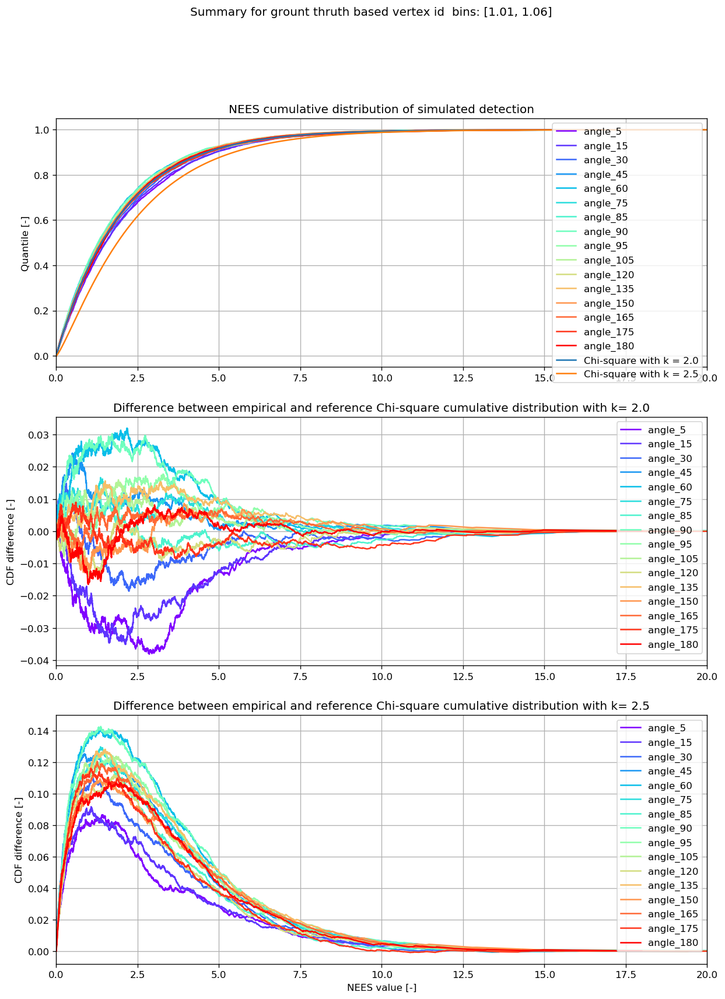

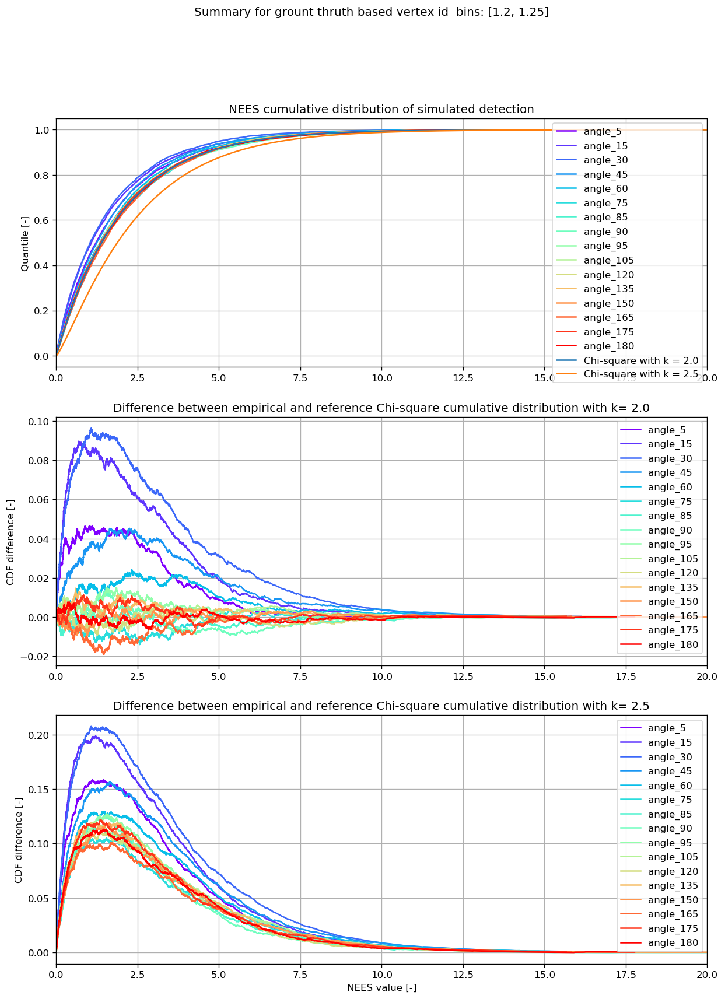

In [13]:
for single_bin in relevant_vertex_bins:
    bin_key = str(single_bin)    
    fig=plt.figure(figsize=(12, 16), dpi= 120, facecolor='w', edgecolor='k')
    fig.suptitle('Summary for grount thruth based vertex id  bins: ' + bin_key)
    plot_disttribution_summary(data, 'gt_vertex_id', single_bin)